Imports

In [1]:

''' Standard Imports '''
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

''' SNS Imports '''
from NetworkGeneration import STDPNetworkGenerator
from NetworkGeneration_MN import MNNetworkGenerator
from sns_toolbox.renderer import render
from sns_toolbox.neurons import SpikingNeuron
from sns_toolbox.connections import SpikingSynapse

''' MuJoCo Imports '''
import mujoco as mj
import mediapy as media

''' Other Misc Imports '''
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from random import Random, randint

''' Make the plots pretty and slooooooow '''
mpl.rcParams['figure.dpi'] = 600 # 600 is pretty high definition

ISI Code

In [2]:

# Takes spike data string, returns frequency of spikes
def getFreq(data, dt):
    loc = np.where(data == 1)[0]
    freq = []
    for i in range(len(loc)-1):
        freq.append(1 / ((loc[i+1] - loc[i]) * (dt * 0.001)))
    # The first element needs to be removed because this is inner spike, so more spikes than frequencies recorded
    loc = loc[1:] * dt
    return freq, loc

Motor neuron activation code

In [3]:

''' Need to update such that there is a dynamic number of motor neurons '''
def randActivation2(t, pair_freq, indi_freq, num_motors):
    i_IN1 = np.zeros([len(t)])
    i_IN2 = np.zeros([len(t)])
    i_IN3 = np.zeros([len(t)])
    i_IN4 = np.zeros([len(t)])

    # Initilize at 0b00
    pair_act = 0b00
    indi_act1 = 0b00
    indi_act2 = 0b00

    for i in range(len(t)):
        if pair_act & 0b01:
            if indi_act1 & 0b01:
                i_IN1[i] += 1
            if indi_act1 & 0b10:
                i_IN2[i] += 1

        if pair_act & 0b10:
            if indi_act2 & 0b01:
                i_IN3[i] += 1
            if indi_act2 & 0b10:
                i_IN4[i] += 1

        if i % pair_freq == 0:
            pair_act = randint(0, 3)
            
        if i % indi_freq == 0:
            indi_act1 = randint(0, 3)
            indi_act2 = randint(0, 3)
    
    return i_IN1, i_IN2, i_IN3, i_IN4


Random conductance matrix generator for synaptic connections

In [4]:

def randConnections(pre_num, post_num, seed=None, g_min=1.50, g_max=5.00):
    if seed is not None:
        rng = Random(x=seed)
    else:
        rng = Random()
    '''
    For Conductances
    2.99 is a barely spikes the post when paired.
    g_max is for solo spiking. 
    '''
    g_min = int(g_min * 100) # Convert to int
    g_max = int(g_max * 100) # Convert to int

    # Empty matrix for conductivity parameters
    matrix = np.zeros([pre_num + post_num, pre_num + post_num])

    for pre in range(0, pre_num):
        for post in range(pre_num, pre_num + post_num):
            matrix[post, pre] = (rng.randint(g_min, g_max) / 100)
    
    return matrix

Ia feedback to current conversion

In [5]:

# Base spiking rate of 80Hz (Current corresponding to the spiking rate)
BASERATE = 82 # Hz
BASERATE_CURRENT = 1.09 # Old method. Amount of current to achieve ~82Hz

# Equation relating input current to output spike frequency. Modeled in "Plot_CurrentFrequencyRelation" code
def freq2cur(freq):
    T_fit = 0.00499132 # From equation fit to experimental data for neuron firing rate based on current
    return 1 / (-1*np.exp(-1 / (T_fit * freq)) + 1)

''' Emulates type Ia feedback converting length/velocity data into current to be sent to sensory neuron '''
def vel2cur(length, velocity):
    # Convert to mm for the equation
    length = length * 1000
    velocity = velocity * 1000
    current = np.zeros(len(length))
    for neuron in range(len(length)):
        if velocity[neuron] >= 0:
            # Calculate the current to be sent to the neuron
            # current[neuron] = BASERATE + 0.05*velocity[neuron] + 0.005 * length[neuron]
            # Prochazka's Equation. Desired spiking frequency
            # Ia_Spike_Freq = (4.3 * velocity[neuron]**0.6) + (2 * length[neuron]) + BASERATE
            Ia_Spike_Freq = (4.3 * velocity[neuron]**0.6) + BASERATE
            # Calculate the current that alligns to the desired spike frequency
            current[neuron] = freq2cur(Ia_Spike_Freq)

        # Ensure it remains above the baserate
        if current[neuron] < BASERATE_CURRENT:
            current[neuron] = BASERATE_CURRENT
    return current

Import XML file of test leg

""

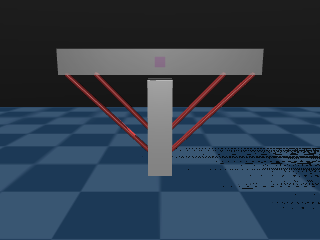

In [6]:

''' Load MuJoCo File '''
# Load model
mjmodel = mj.MjModel.from_xml_path('MJ_Leg_Rev3.xml')
mjdata = mj.MjData(mjmodel)
# Create MuJoCo renderer
renderer = mj.Renderer(mjmodel)

# Camera options for the fun of it
mj_camera = ['fixed', 'Angle2', 'Angle3', 'Angle4', 'Angle5']
active_camera = 4

# Show image of XML file for reference
mj.mj_forward(mjmodel, mjdata)
renderer.update_scene(mjdata, camera=mj_camera[0])
media.show_image(renderer.render())
renderer.close() # Needed to prevent crashing?

Time parameters for neural networks and MuJuCo simulations

In [7]:

''' SNS Parameters '''
sns_dt = 0.1 # ms NOTE: This aligns to the XML file. You cannot change this without changing the other!
sns_tmax = 16000 # ms
sns_t = np.arange(0, sns_tmax, sns_dt)

''' MuJoCo Parameters '''
mj_dt = sns_dt / 1000 # Converts to seconds. essentially 0.0001 s
mj_tmax = sns_tmax / 1000 # Converts to seconds. essentially 10.000 s
mj_t = np.arange(0, mj_tmax, mj_dt)

framerate = 60 # fps for movie capture

STDP Neural Network Creation and Parameter Definition

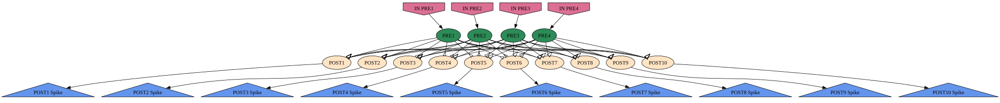

In [8]:

# Define pre- and postsynaptic neurons
pre_neuron = SpikingNeuron(
    threshold_proportionality_constant=0.0,
    threshold_initial_value=1.0
)
post_neuron = SpikingNeuron(
    threshold_proportionality_constant=0.0,
    threshold_initial_value=1.0
)
# Define Synapse
synapse = SpikingSynapse(
    reversal_potential=2.0,
    max_conductance=3.0
)

# Parameters for the number of neurons
STDP_PRE_NUM = 4
STDP_POST_NUM = 10

# Send to function to generate the network
net = STDPNetworkGenerator(presynaptic_type=pre_neuron, postsynaptic_type=post_neuron, presynaptic_neurons=STDP_PRE_NUM, postsynaptic_neurons=STDP_POST_NUM, synapse_type=synapse)

# Network learning variables
# LTP
ltp_a = 0.010 #0.016
ltp_t = 0.5
# LTD
ltd_a = 0.012
ltd_t = 2.5
max_condutance = 5.0

# Display the network
render(net)

Motor neuron network creation

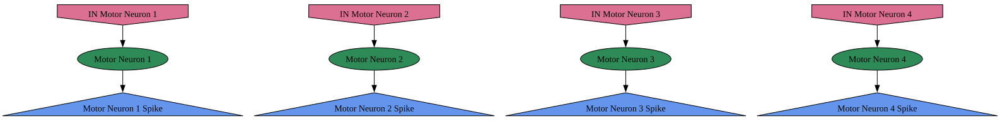

In [9]:

# Define spiking motor neuron
motor_neuron = SpikingNeuron(
    threshold_proportionality_constant=0.0,
    threshold_initial_value=1.0
)

# Parameter for number of motor neurons (should like up with number of presynaptic neurons)
MOTOR_NEURON_NUM = STDP_PRE_NUM

# Send to function to generate the network as desired
net_motor = MNNetworkGenerator(neuron_type=motor_neuron, motor_neurons=MOTOR_NEURON_NUM)

# Display the network
render(net_motor)

Compile motor neuron network and learning neural network

In [10]:

# Compile learning network
sns_stdp_network = net.compile(dt=sns_dt, backend='numpy', debug=False,
                STDP_PRE=STDP_PRE_NUM, STDP_POST=STDP_POST_NUM,
                STDP_LTP_A=ltp_a, STDP_LTP_T=ltp_t, STDP_LTD_A=ltd_a, STDP_LTD_T=ltd_t,
                MAX_CONDUCTIVITY=max_condutance)


# Compile motor neuron network
sns_mn_network = net_motor.compile(dt=sns_dt, backend='numpy_standard', debug=False)

Randomize initial synaptic connections

In [11]:

RANDOMIZED_CONDUCTIVITY = randConnections(STDP_PRE_NUM, STDP_POST_NUM)

# Print statements if you want to check 
print(sns_stdp_network.__dict__.get('g_max_spike'))
# print(sns_stdp_network.g_increment)
print(sns_stdp_network.g_max_spike[STDP_PRE_NUM:, 0:STDP_PRE_NUM])
# print(sns_stdp_network.__dict__.get('pre_spike_diff'))
# print(sns_stdp_network.__dict__.get('post_spike_diff'))

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [3. 3. 3. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
[[3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]
 [3. 3. 3. 3.]]


Initialize MuJoCo parameters and stored values

In [12]:

# Number of muscles in MuJoCo model
MJ_MUSCLE_NUM = MOTOR_NEURON_NUM

''' Motor Neuron '''
# Activation sent to SNS
mn_activation_current = np.zeros(shape=(len(sns_t), net_motor.get_num_inputs_actual()))

# Motor neuron output from SNS 
mn_data = np.zeros(shape=(len(sns_t), net_motor.get_num_outputs_actual()))

''' Sensor feedback from MuJoCo '''
mj_length_data = np.zeros(shape=[len(mj_t), MJ_MUSCLE_NUM])
mj_velocity_data = np.zeros(shape=[len(mj_t), MJ_MUSCLE_NUM])

# Resting length recording
mj_length_resting = mjdata.sensordata[0:MJ_MUSCLE_NUM].copy()

''' STDP Network Parameters '''
# Current to Inject into Ia Feedback Neurons == INTO SNS
stdp_activation_current = np.zeros(shape=(len(sns_t), net.get_num_inputs_actual()))

# Learning network output data collection == OUTPUT of SNS
stdp_data = np.zeros([len(sns_t), net.get_num_outputs_actual()])

''' Assigning injected current to motor neurons '''
mn1, mn2, mn3, mn4 = randActivation2(sns_t, 10000, 2000, num_motors=MJ_MUSCLE_NUM)

activation_level = 1.1

mn_activation_current[:, 0] = mn1 * activation_level
mn_activation_current[:, 1] = mn2 * activation_level
mn_activation_current[:, 2] = mn3 * activation_level
mn_activation_current[:, 3] = mn4 * activation_level

MAX_MUSCLE_POWER = 1

# Tracking changes in conductance over the simulation
g_track = np.zeros(shape=[len(sns_t), STDP_POST_NUM, STDP_PRE_NUM])

Set up MuJoCo renderer and frames

In [13]:

# Set up variable to capture frames
frames = []
# Reset Simulation
mj.mj_resetData(mjmodel, mjdata)
# Restart Renderer
renderer = mj.Renderer(mjmodel)

Run "The Simulation"

In [14]:

for i in range(len(sns_t)):

    ''' Motor Neuron SNS '''
    mn_data[i,:] = sns_mn_network(mn_activation_current[i,:])

    ''' Spiking Motor Neuron === Muscle Activation '''
    if sum(sns_mn_network.__dict__.get('spikes')) != 0:
        mn_spike = sns_mn_network.__dict__.get('spikes')

        # If a spike occured for a specific motor, activate it for a timestep
        for muscle in range(MJ_MUSCLE_NUM):
            if mn_spike[muscle] != 0:
                mjdata.act[muscle] = MAX_MUSCLE_POWER
            else:
                mjdata.act[muscle] = 0.0
    else:
        mjdata.act[:] = 0.0

    ''' Advance MuJoCo Simulation '''
    mj.mj_step(mjmodel, mjdata)

    # Capture frame data if it corresponds to framerate demands
    if len(frames) < mjdata.time*framerate:
        if len(frames) % 120 == 0:
            active_camera += 1
            if active_camera >= len(mj_camera):
                active_camera = 0
        renderer.update_scene(mjdata, camera=mj_camera[active_camera])
        pixels = renderer.render().copy()
        frames.append(pixels)
    

    ''' Record MuJoCo Sensor Outputs '''
    mj_length_data[i] = mjdata.sensordata[0:MJ_MUSCLE_NUM]
    mj_velocity_data[i] = mjdata.sensordata[MJ_MUSCLE_NUM:]

    # Subtract resting length to get displacement. Not sure if this is the right way?
    mj_length_data[i] = mj_length_data[i] - mj_length_resting
    
    # Convert Ia feedback (length & velocity) to current input into neuron
    stdp_activation_current[i] = vel2cur(length=mj_length_data[i], velocity=mj_velocity_data[i])

    ''' STDP SNS '''
    # At the first call, update the conductance matrix. Afterwards, do not
    if i == 0:
        stdp_data[i, :] = sns_stdp_network(stdp_activation_current[i, :], current_time=sns_t[i], dt=sns_dt, g_update=RANDOMIZED_CONDUCTIVITY)
    else:
        stdp_data[i, :] = sns_stdp_network(stdp_activation_current[i, :], current_time=sns_t[i], dt=sns_dt)

    # Record conductance values to plot
    g_track[i] = sns_stdp_network.g_max_spike[STDP_PRE_NUM:, 0:STDP_PRE_NUM]

# Fix data orientation for better plotting
mj_length_data = mj_length_data.transpose()
mj_velocity_data = mj_velocity_data.transpose()
stdp_activation_current = stdp_activation_current.transpose()
stdp_data = stdp_data.transpose()

Play Simulation Video

In [15]:

media.show_video(frames, fps=framerate)

Muscle Length and Velocity Data


In [16]:

# Length
plt.figure(figsize=[25, 8])
plt.subplot(3, 1, 1)
for i in range(MJ_MUSCLE_NUM):
    plt.plot(mj_t, mj_length_data[i,:], label=('Muscle: ' + str(i + 1)))
plt.title('Muscle Length Data')
plt.ylabel('Length (m)')
plt.legend()

# Velocity
plt.subplot(3, 1, 2)
for i in range(MJ_MUSCLE_NUM):
    plt.plot(mj_t, mj_velocity_data[i,:], label=('Muscle: ' + str(i + 1)))
plt.title('Muscle Velocity Data')
plt.ylabel('Velocity (m/s)')
plt.legend()

# Current into STDP SNS
plt.subplot(3, 1, 3)
for i in range(MJ_MUSCLE_NUM):
    plt.plot(mj_t, stdp_activation_current[i,:], label=('Pre: ' + str(i + 1)))
plt.title('Presynaptic Activation Current')
plt.legend()
plt.ylabel('Curernt (nA)')
plt.xlabel('Time (s)')

plt.subplots_adjust(hspace=0.5)

plt.show()

Postsynaptic spike instances

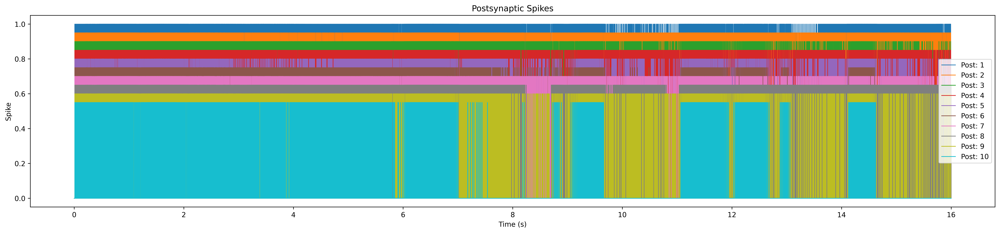

In [17]:

plt.figure(figsize=[25, 5])
for i in range(net.get_num_outputs_actual()):
    plt.plot(mj_t, stdp_data[i,:] * (1 - 0.05*i), linewidth='1', label=('Post: ' + str(i + 1)))
plt.ylabel('Spike')
plt.xlabel('Time (s)')
plt.title('Postsynaptic Spikes')
plt.legend()
plt.show()

Postsynaptic neuron spike frequency

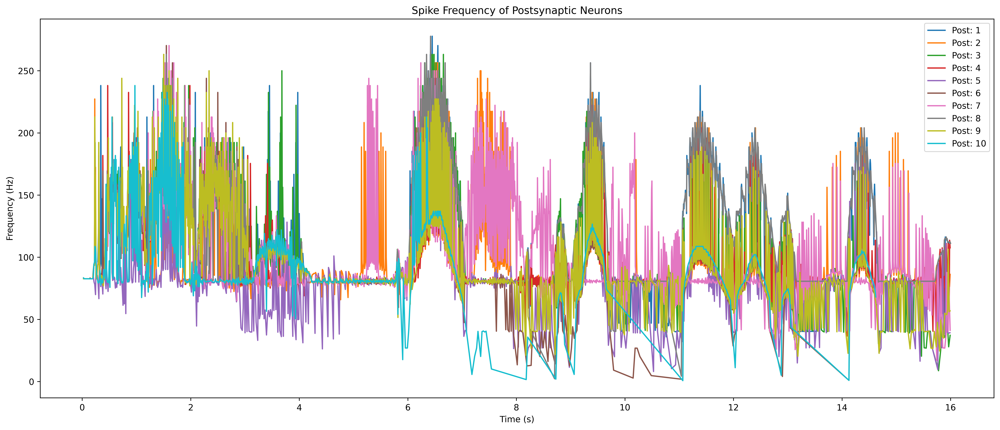

In [18]:

plt.figure(figsize=[20, 8])
for i in range(net.get_num_outputs_actual()):
    freq, loc = getFreq(data=stdp_data[i,:], dt=sns_dt)
    # print(np.mean(freq))
    plt.plot(loc/1000, freq, label=('Post: ' + str(i + 1)))
plt.ylim()
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.title('Spike Frequency of Postsynaptic Neurons')
plt.legend()
plt.show()

In [19]:
print(sns_stdp_network.__dict__.get('g_max_spike'))
print(sns_stdp_network.__dict__.get('g_increment'))

print(sns_stdp_network.g_max_spike[STDP_PRE_NUM:, 0:STDP_PRE_NUM])

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 4.99906007e+00 2.34489417e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00


Conductance History

In [20]:

plt.figure(figsize=[25, STDP_POST_NUM * 3])

for post in range(STDP_POST_NUM):
    plt.subplot(STDP_POST_NUM, 1, post + 1)
    plt.title('↓ Post Synaptic Neuron ' + str(post + 1) + '↓')
    for pre in range(STDP_PRE_NUM):
        plt.plot(mj_t, g_track[:, post, pre], label=('Pre Neuron ' + str(pre + 1)))
        plt.ylim([0, max_condutance+1])
    plt.ylabel('Conductance (uS)')
    plt.xlabel('Time (s)')
    plt.legend()
plt.subplots_adjust(hspace=0.5)
plt.show()